#### 📚PN : 5
📚[PN : 4](https://www.kaggle.com/sarabhian/spp-free-time-learning-optuna-auto-tuning)



#  🎹 Song Popularity Prediction 🎸 <br>


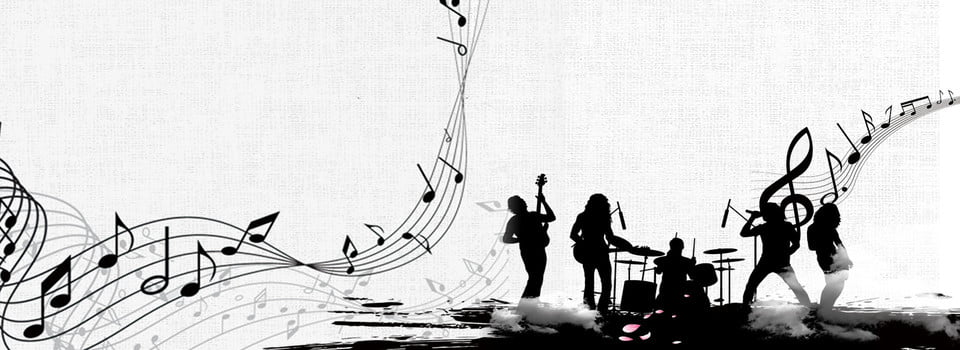
<br>

This Notebook will be some experimentation of few libraries , hope you will llike it , <br>

<a id ="welcome"/><br>

##  Table of Content <br>
* 1. [welcome](#welcome)<br>
* 2. [Intro](#intro)<br>
* 3. [Data loading and preparation](#dlp)<br>
    * 3.1. [Import Libraries](#il)
    * 3.2. [Import Data](#id)
    * 3.3. [Pycaret EDA](#pe)
* 4. [Feature Engineering](#FE)
    * 4.1. [Missing Value Analysis](#mva)
    * 4.2. [new feature generation](#nfg)
    * 4.3. [PCA](#pca)
    * 4.4. [dropping irrelevant features](#dif)
    * 4.5. [outlier fixing (if any )](#oa)
* 5. [Pycaret Model Analysis](#pma) 
* 6. [Model ](#m)
* 7. [prediction](#p)
* 8. [conclusion](#c)<br>
let's start the game then🏊‍  


( in the end tell me in comments what you feel about this mixed  use of pycaret + Optuna 

<a id="intro"/><br>

# 💠 Intro 

Can we use Pycaret and Otuna together 🤔,Is it a good idea? <br>
let's See , I can guarantee you will enjoy reading this notebook ,I tried my best to add comments at each step.

<a id="dlp"/><br>

## 💠 Data Loading and preperation 

In this part  we will look for basic EDA and learn pycaret 

<a id="il"/><br>

## 🔅 Import libraries  



In [1]:
%%capture
!pip install pycaret[full]

In [2]:
import os 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns 

import missingno as msno
from scipy import stats
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

In [3]:
from pycaret.classification import *

In [4]:
from collections import Counter
from sklearn.model_selection import StratifiedKFold , train_test_split
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve,auc


from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import AdaBoostClassifier , GradientBoostingClassifier 

import optuna


<a id="id"/><br>

## 🔅 Import data 

In [5]:
MAIN_PATH = "../input/song-popularity-prediction/"
tdf = pd.read_csv(MAIN_PATH + 'train.csv')
Tdf = pd.read_csv(MAIN_PATH + 'test.csv')
Sdf = pd.read_csv(MAIN_PATH + 'sample_submission.csv')

In [6]:
tdf.head(3)


,id,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence,song_popularity
0,0,212990.0,0.642286,0.856520,0.707073,0.002001,10.0,NaN,-5.619088,0,0.082570,158.386236,4,0.734642,0
1,1,NaN,0.054866,0.733289,0.835545,0.000996,8.0,0.436428,-5.236965,1,0.127358,102.752988,3,0.711531,1
2,2,193213.0,NaN,0.188387,0.783524,-0.002694,5.0,0.170499,-4.951759,0,0.052282,178.685791,3,0.425536,0


These are audio feature , but it's very bad that we got only features of audio and not any audio data ☹  (जाउद्या )   it's ok ,it makes problem more easy then 😅

<a id="pe"/><br>

## 💥 Pycaret EDA

In [7]:
EDA = setup(data = tdf , target = 'song_popularity', profile =True ,silent =True ,session_id =47 ) 
## profile --plots pycaret profile 
## silent -- removes checkout buttons i.e. won't ask for 'enter'
## session_id -- work as seed

Summarize dataset:   0%|          | 0/28 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

let's create a quick model using pycaret of ada boost to check the feature importance

In [8]:
ada = create_model('ada' ,fold =5  )

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6377,0.5776,0.0441,0.5294,0.0815,0.0270,0.0608
1,0.6330,0.5611,0.0461,0.4608,0.0838,0.0188,0.0391
2,0.6350,0.5520,0.0338,0.4825,0.0632,0.0163,0.0398
3,0.6343,0.5533,0.0446,0.4764,0.0816,0.0205,0.0439
4,0.6390,0.5543,0.0471,0.5517,0.0868,0.0313,0.0698
Mean,0.6358,0.5597,0.0432,0.5002,0.0794,0.0228,0.0507
SD,0.0022,0.0095,0.0048,0.0345,0.0083,0.0055,0.0124


even if we just predict model using ada we will get `AUC` score of `0.56` 😅 , interesting isn't it ?

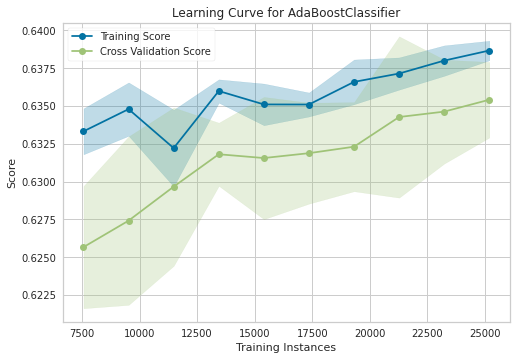

In [9]:
plot_model(ada ,'learning')

what a curve 🧐

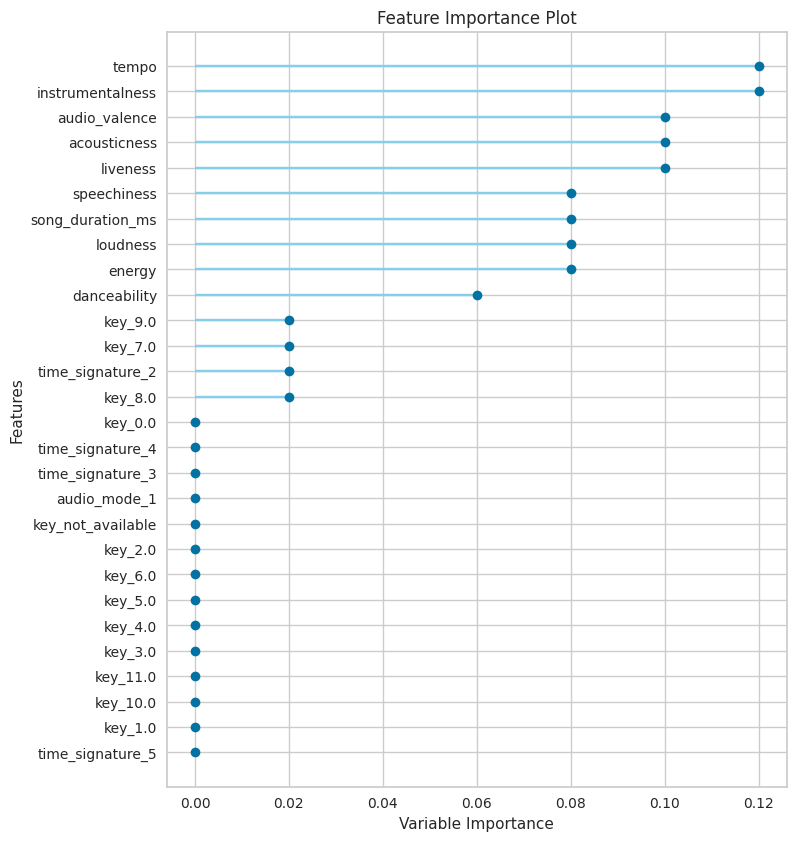

In [10]:
plot_model(ada ,plot ='feature_all')

so currently  we are having few significant  features , but  our model is currently a bogus model ,let's fix some missing value , do some feature engineering then we will check how features are improving their significance🙃

`ada` is good model but we will check the best model after some feature engineering

we can do EDA using pandas profile but Pycaret EDA is little easy and more descriptive😅

### ⭕ Conclusion of EDA : 
1. High Correlation in few feature  : `energy` ,`acousticness` ,`loudness`
2. High Missing values : `song_duration_ms`, `acousticness`, `danceability`, `energy`, `instrumentalness`, `key`, `liveness`, `loudness`
3. Few Features are irrelevant: `id`
4. To understand data properly reader need prior experince , which I don't have 🙂 ( if you don't understand anything from above profile then first do EDA manually )

#### 🗽[go to top](#welcome)🗽

<a id ='FE' /> <br>

## 💠 Feature Engineering

In this part we will do :
1. missing value analysis
2. new feature generation
3. dropping irrelevant features 
4. outlier fixing (if any )

after each step we will compare the model accuracy by quick model of pycaret , it will help us to tell which sstep is right or wrong

In [11]:
col = list(tdf.columns)
print(col)

['id', 'song_duration_ms', 'acousticness', 'danceability', 'energy', 'instrumentalness', 'key', 'liveness', 'loudness', 'audio_mode', 'speechiness', 'tempo', 'time_signature', 'audio_valence', 'song_popularity']


In [12]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer ,KNNImputer ,SimpleImputer
from sklearn.decomposition import PCA

In [13]:

t_df = tdf.copy()  # making copy of Train 
t_df = t_df.drop(columns ='id',axis =1)

<a id ='mva' /><br>

### 🧩 Missing Value

In [14]:
t_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   song_duration_ms  35899 non-null  float64
 1   acousticness      36008 non-null  float64
 2   danceability      35974 non-null  float64
 3   energy            36025 non-null  float64
 4   instrumentalness  36015 non-null  float64
 5   key               35935 non-null  float64
 6   liveness          35914 non-null  float64
 7   loudness          36043 non-null  float64
 8   audio_mode        40000 non-null  int64  
 9   speechiness       40000 non-null  float64
 10  tempo             40000 non-null  float64
 11  time_signature    40000 non-null  int64  
 12  audio_valence     40000 non-null  float64
 13  song_popularity   40000 non-null  int64  
dtypes: float64(11), int64(3)
memory usage: 4.3 MB


we can see there are lot of `missing values` in the data in `columns :` `song_duration_ms`, `acousticness`, `danceability`, `energy`, `instrumentalness`, `key`, `liveness`, `loudness` (to `visiualize` the missing value we can use` msno.matrix`)

we will fix half of the data with `iterative imputer` and half of the data with `KNNimputer` <br>
those features which are `highly correlated` we will impute them `using iterative imputer` , and those which are `categorical` we will use `KNNImputer`

Highly correlated features are : `energy` ,`acousticness` ,`loudness`

In [15]:
X1 = t_df[['song_duration_ms','liveness',  'danceability',  'instrumentalness','energy' ,'acousticness' ,'loudness']] 
X2 = t_df[[ 'key']]

iter_im  = IterativeImputer(random_state =47 ,max_iter = 60)
X1_out = iter_im.fit_transform(X1)

knn_im = KNNImputer(n_neighbors=5, weights='uniform')
X2_out = knn_im.fit_transform(X2)

In [16]:
t_df[['song_duration_ms','liveness',  'danceability',  'instrumentalness','energy' ,'acousticness' ,'loudness']] = X1_out
t_df[[ 'key']] = X2_out
t_df.head()


,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence,song_popularity
0,212990.000000,0.642286,0.856520,0.707073,0.002001,10.0,0.203365,-5.619088,0,0.082570,158.386236,4,0.734642,0
1,196806.646442,0.054866,0.733289,0.835545,0.000996,8.0,0.436428,-5.236965,1,0.127358,102.752988,3,0.711531,1
2,193213.000000,0.173982,0.188387,0.783524,-0.002694,5.0,0.170499,-4.951759,0,0.052282,178.685791,3,0.425536,0
3,249893.000000,0.488660,0.585234,0.552685,0.000608,0.0,0.094805,-7.893694,0,0.035618,128.715630,3,0.453597,0
4,165969.000000,0.493017,0.637539,0.740982,0.002033,10.0,0.094891,-2.684095,0,0.050746,121.928157,4,0.741311,0


In [17]:
t_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   song_duration_ms  40000 non-null  float64
 1   acousticness      40000 non-null  float64
 2   danceability      40000 non-null  float64
 3   energy            40000 non-null  float64
 4   instrumentalness  40000 non-null  float64
 5   key               40000 non-null  float64
 6   liveness          40000 non-null  float64
 7   loudness          40000 non-null  float64
 8   audio_mode        40000 non-null  int64  
 9   speechiness       40000 non-null  float64
 10  tempo             40000 non-null  float64
 11  time_signature    40000 non-null  int64  
 12  audio_valence     40000 non-null  float64
 13  song_popularity   40000 non-null  int64  
dtypes: float64(11), int64(3)
memory usage: 4.3 MB


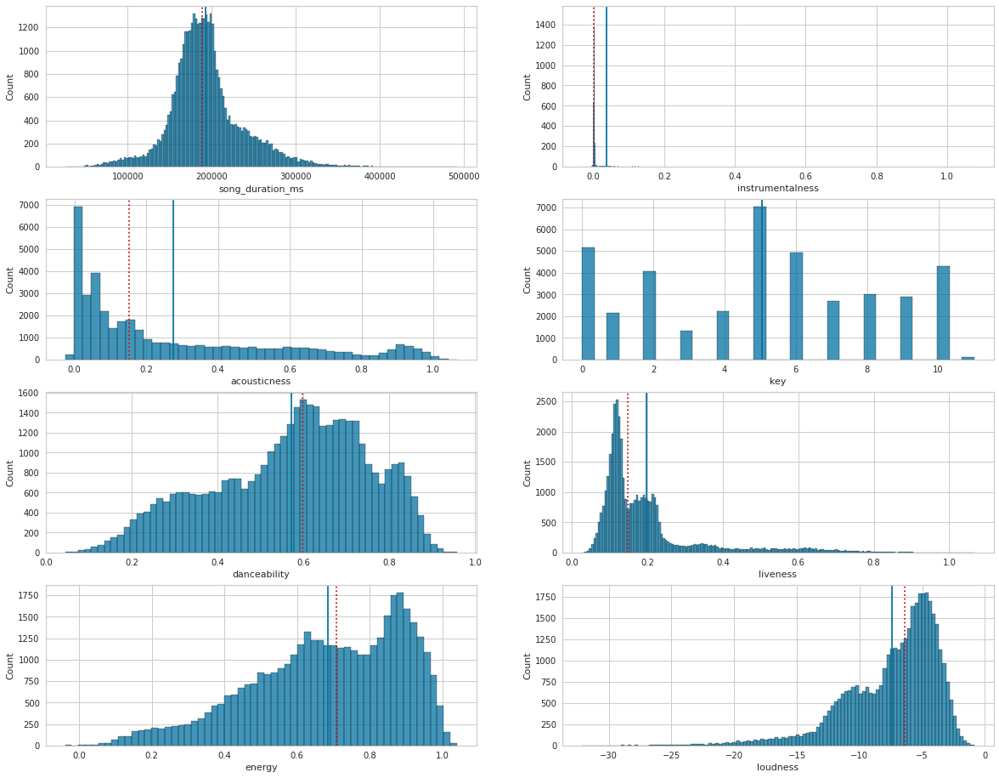

In [18]:
missing_col =['song_duration_ms', 'acousticness', 'danceability', 'energy', 'instrumentalness', 
               'key', 'liveness', 'loudness']
def feature_plotter(data , col_list):
    fig , ax = plt.subplots(4 ,2 ,figsize=(20,16))
    for i , c in enumerate(col_list):
        if i< 4:
            sns.histplot(data=data , x = c  , ax= ax[i,0] ) 
            ax[i,0].axvline(data[c].median(),color='r', linestyle=':')
            ax[i,0].axvline(np.mean(data[c]),color='b', linestyle='-')
#             ax[i,0].axvline(stats.mode(data[c])[0][0],color='g', linestyle='-.',linewidth=2)
          
        else : 
            sns.histplot(data=data , x = c , ax= ax[i-4,1] )
            ax[i-4,1].axvline(data[c].median(),color='r', linestyle=':')
            ax[i-4,1].axvline(np.mean(data[c]),color='b', linestyle='-')
#             ax[i-4,1].axvline(stats.mode(data[c])[0][0],color='g', linestyle='-.')

feature_plotter(t_df ,missing_col)


ok all of them are looking fine , let's quick check the change in model

In [19]:
clf= setup(data = t_df , target = 'song_popularity' ,silent =True ,session_id =47 )
ada= create_model('ada' , fold = 5)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6357,0.5742,0.0481,0.4975,0.0877,0.0251,0.0529
1,0.6354,0.5626,0.0593,0.4939,0.1060,0.0302,0.0577
2,0.6339,0.5610,0.0378,0.4667,0.0699,0.0162,0.0371
3,0.6336,0.5512,0.0481,0.4689,0.0872,0.0209,0.0429
4,0.6383,0.5607,0.0495,0.5372,0.0907,0.0311,0.0670
Mean,0.6354,0.5619,0.0486,0.4928,0.0883,0.0247,0.0515
SD,0.0017,0.0073,0.0068,0.0255,0.0115,0.0056,0.0106


we got little change but it's very less 🙂, let's enhance the model using high correlation features

#### 🗽[go to top](#welcome)🗽

<a id ='pca' /><br>

### 🎯PCA

In [20]:
scalar = StandardScaler()
pca = PCA(n_components=3)
X = t_df.drop('song_popularity',axis =1)

scaled_tdf = scalar.fit_transform(X)
X_pca = pca.fit_transform(scaled_tdf)
t_df[['pca1','pca2','pca3']] = X_pca

print(f"shape of X :{X.shape}\nshape of X_pca{X_pca.shape}")

shape of X :(40000, 13)
shape of X_pca(40000, 3)


In [21]:
clf= setup(data = t_df , target = 'song_popularity' ,silent =True ,session_id =47  )
ada= create_model('ada' , fold = 5)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6312,0.5778,0.0466,0.4398,0.0843,0.0156,0.0315
1,0.6336,0.5623,0.0515,0.4709,0.0928,0.0227,0.0452
2,0.6327,0.5620,0.0402,0.4505,0.0738,0.0151,0.0329
3,0.6329,0.5544,0.0515,0.4626,0.0927,0.0213,0.0421
4,0.6369,0.5639,0.0490,0.5155,0.0896,0.0281,0.0596
Mean,0.6335,0.5641,0.0478,0.4678,0.0866,0.0205,0.0422
SD,0.0019,0.0076,0.0042,0.0260,0.0071,0.0048,0.0101


<a id ='nfg' /><br>

### 📑 New Feature Generation

we know loudness is log decibal form of energy so obviously those two features will have high correlation , let's denormalize them to get new feature, and acousticness is just digital form of energy spectrum so let's restructure it aswell

In [22]:
t_df['log_norm_EL'] = t_df['energy']+ np.exp(t_df['loudness'])*100
t_df['deNorm_acoust'] = t_df['acousticness']*t_df['log_norm_EL']
t_df.head(3)

,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence,song_popularity,pca1,pca2,pca3,log_norm_EL,deNorm_acoust
0,212990.000000,0.642286,0.856520,0.707073,0.002001,10.0,0.203365,-5.619088,0,0.082570,158.386236,4,0.734642,0,-1.200400,-0.558013,-0.518242,1.069868,0.687161
1,196806.646442,0.054866,0.733289,0.835545,0.000996,8.0,0.436428,-5.236965,1,0.127358,102.752988,3,0.711531,1,-1.515772,-1.114127,1.807879,1.367182,0.075011
2,193213.000000,0.173982,0.188387,0.783524,-0.002694,5.0,0.170499,-4.951759,0,0.052282,178.685791,3,0.425536,0,-0.279349,2.653912,0.124362,1.490620,0.259340


In [23]:
clf= setup(data = t_df , target = 'song_popularity' ,silent =True ,session_id =47  )
ada= create_model('ada' , fold = 5)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6295,0.5759,0.0535,0.4291,0.0951,0.0157,0.0295
1,0.6312,0.5638,0.0569,0.4496,0.1010,0.0209,0.0391
2,0.6327,0.5643,0.0461,0.4563,0.0837,0.0181,0.0374
3,0.6330,0.5543,0.0574,0.4680,0.1022,0.0247,0.0467
4,0.6346,0.5649,0.0441,0.4813,0.0809,0.0210,0.0452
Mean,0.6322,0.5646,0.0516,0.4569,0.0926,0.0201,0.0396
SD,0.0017,0.0068,0.0055,0.0176,0.0088,0.0030,0.0062


we can see  these features are decreasing the score but let's check it using feature importance 

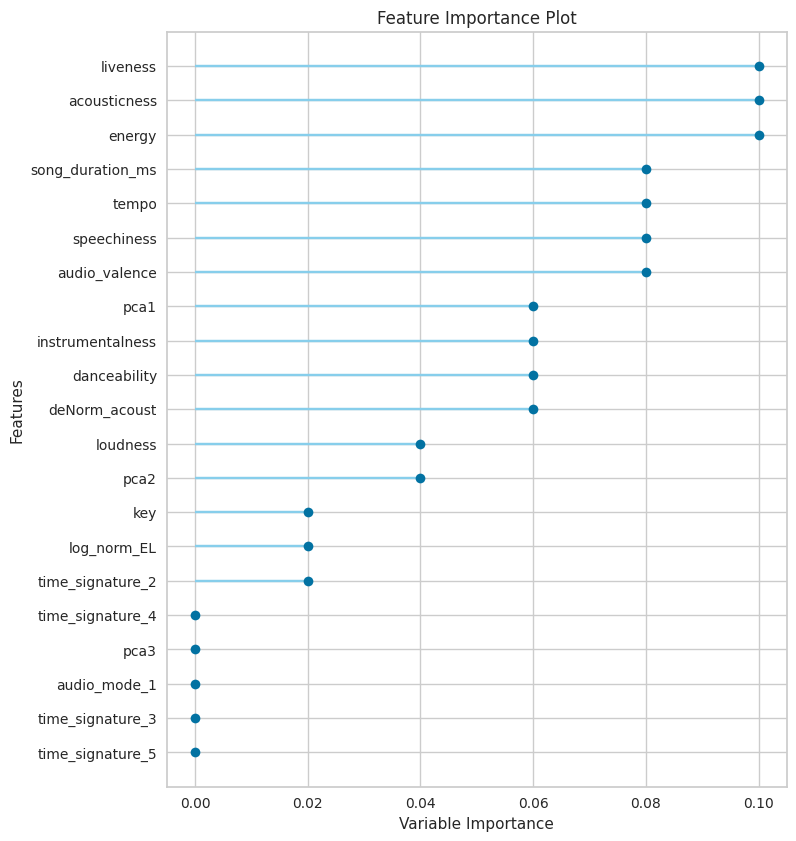

In [24]:
plot_model(ada ,'feature_all')

so definitely these are supporting the model

#### 🗽[go to top](#welcome)🗽

<a id='dif' /><br>

### ⚔ Droping irrelevant features

In [25]:
# tdf = tdf.drop(columns =['key'])

<a id='oa' /><br>

### 🛬 Outlier Analysis

In [26]:
t_df.columns.shape

(19,)

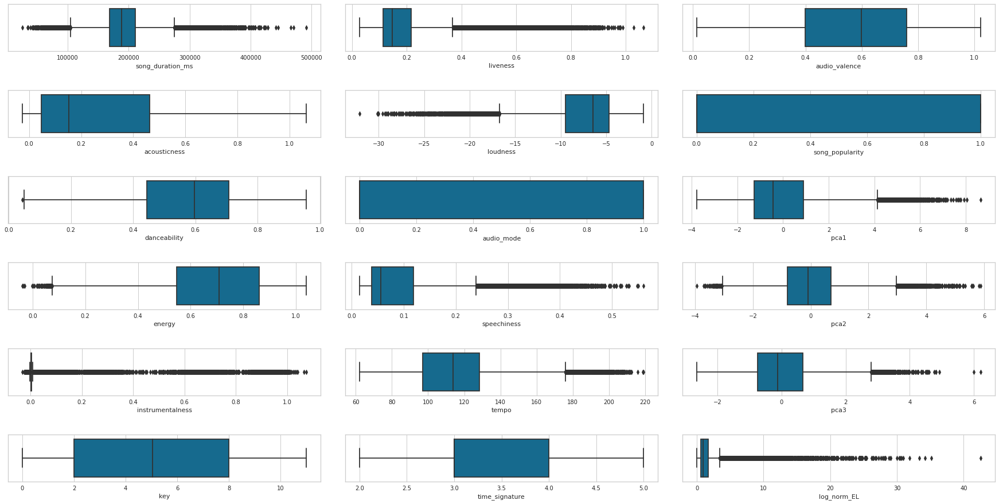

In [27]:
fig , ax = plt.subplots(6 ,3 ,figsize=(25,13))


for i , c in enumerate(list(t_df.columns)):
        if i<6: sns.boxplot(data = t_df ,x=c, hue = "song_popularity" , ax=ax[i][0])
        elif i<12 : sns.boxplot(data = t_df ,x=c, hue = "song_popularity" , ax=ax[i-6][1])
        elif i<18: sns.boxplot(data = t_df ,x=c, hue = "song_popularity" , ax=ax[i-12][2])
        
plt.tight_layout(pad=3)
plt.show()

ok we can see lot of dots there but are they really outliers ? , let's check using IQR

In [28]:
from collections import Counter
def detect_outliers(df,n,features):
    """
    Takes a dataframe df of features and returns a list of the indices
    corresponding to the observations containing more than n outliers according
    to the Tukey method.
    """
    outlier_indices = []
    
    # iterate over features(columns)
    for col in features:
        # 1st quartile (15%)
        Q1 = np.percentile(df[col], 5)
        # 3rd quartile (85%)
        Q3 = np.percentile(df[col],95)
        # Interquartile range (IQR)
        IQR = Q3 - Q1
        
        # outlier step
        outlier_step = 1.2 * IQR
        
        # Determine a list of indices of outliers for feature col
        outlier_list_col = df[(df[col] < Q1 - outlier_step) | (df[col] > Q3 + outlier_step )].index
        
        # append the found outlier indices for col to the list of outlier indices 
        outlier_indices.extend(outlier_list_col)
        
    # select observations containing more than 2 outliers
    outlier_indices = Counter(outlier_indices)        
    multiple_outliers = list( k for k, v in outlier_indices.items() if v > n )
    
    return multiple_outliers   

Outlier analysis Credits : [YASSINE GHOUZAM](https://www.kaggle.com/yassineghouzam/titanic-top-4-with-ensemble-modeling#2.2-Outlier-detection)

In [29]:
col = list(t_df.columns)
print(col)

['song_duration_ms', 'acousticness', 'danceability', 'energy', 'instrumentalness', 'key', 'liveness', 'loudness', 'audio_mode', 'speechiness', 'tempo', 'time_signature', 'audio_valence', 'song_popularity', 'pca1', 'pca2', 'pca3', 'log_norm_EL', 'deNorm_acoust']


In [30]:
to_drop = detect_outliers(t_df, 1, col) 
print(len(t_df.loc[to_drop]))
# Drop outliers


103


In [31]:
t_df = t_df.drop(to_drop, axis = 0).reset_index(drop=True)
t_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39897 entries, 0 to 39896
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   song_duration_ms  39897 non-null  float64
 1   acousticness      39897 non-null  float64
 2   danceability      39897 non-null  float64
 3   energy            39897 non-null  float64
 4   instrumentalness  39897 non-null  float64
 5   key               39897 non-null  float64
 6   liveness          39897 non-null  float64
 7   loudness          39897 non-null  float64
 8   audio_mode        39897 non-null  int64  
 9   speechiness       39897 non-null  float64
 10  tempo             39897 non-null  float64
 11  time_signature    39897 non-null  int64  
 12  audio_valence     39897 non-null  float64
 13  song_popularity   39897 non-null  int64  
 14  pca1              39897 non-null  float64
 15  pca2              39897 non-null  float64
 16  pca3              39897 non-null  float6

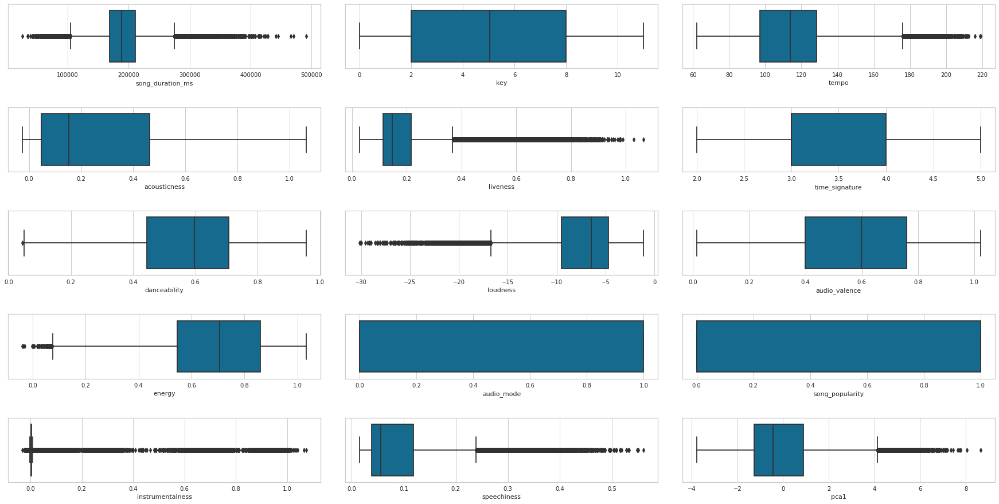

In [32]:
fig , ax = plt.subplots(5 ,3 ,figsize=(25,13))


for i , c in enumerate(list(t_df.columns)):
        if i<5: sns.boxplot(data = t_df ,x=c, hue = "song_popularity" , ax=ax[i][0])
        elif i<10 : sns.boxplot(data = t_df ,x=c, hue = "song_popularity" , ax=ax[i-5][1])
        elif i<15: sns.boxplot(data = t_df ,x=c, hue = "song_popularity" , ax=ax[i-10][2])
        
plt.tight_layout(pad=3)
plt.show()

#### 🗽[go to top](#welcome)🗽

Let's Define a function Feature Engineering so that we can use it on Test data 

In [33]:
def FE( data , fix_missing_value = True ,generate_new_feature = True,do_pca =True  ,pca_comp = 3 ,  drop_irrelavnt = True):
    if fix_missing_value :
        X1 = data[['song_duration_ms','liveness',  'danceability',  'instrumentalness','energy' ,'acousticness' ,'loudness']] 
        X2 = data[[ 'key']]

        iter_im  = IterativeImputer(random_state =47 ,max_iter = 60)
        X1_out = iter_im.fit_transform(X1)

        knn_im = KNNImputer(n_neighbors=5, weights='uniform')
        X2_out = knn_im.fit_transform(X2)
        
        data[['song_duration_ms','liveness',  'danceability',  'instrumentalness','energy' 
              ,'acousticness' ,'loudness']] = X1_out
        data[[ 'key']] = X2_out
        
    if generate_new_feature :
        data['log_norm_EL'] = data['energy']+ np.exp(data['loudness'])*100
        data['deNorm_acoust'] = data['log_norm_EL']*data['acousticness']
        
    if do_pca :
        scalar = StandardScaler()
        pca = PCA(n_components=pca_comp)
        X = data

        scaled_tdf = scalar.fit_transform(X)
        X_pca = pca.fit_transform(scaled_tdf)
        data = pd.concat([data , pd.DataFrame(X_pca)],axis=1)
        [data.rename(columns = {i : ('pca' +str(i+1)) }, inplace = True ) for i in range(3)]
        print(f"shape of X :{X.shape}\nshape of X_pca{X_pca.shape}")
#     if drop_irrelant :
#         data = data.drop(columns = ['key'])
    
    return data
        

#### 🗽[go to top](#welcome)🗽

<a id ="pma"/><br>

## 🏝 Pycaret Model Analysis 

Now let's compare some models to do ensembling

I am using 5 fold just to decrerase runtime of notebook ,you can use any fold,

we can see improvement in the model after feature engineering

In [34]:
clf= setup(data = t_df , target = 'song_popularity' ,silent =True ,session_id = 47 )
best = compare_models(sort='AUC',exclude =['xgboost','catboost','gbc'],fold =5,n_select=5) 
# excluding time consuming models check model efficiency in version 5 of the notebook

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
ada,Ada Boost Classifier,0.6316,0.5652,0.0423,0.4381,0.0769,0.0144,0.0298,1.5320
lightgbm,Light Gradient Boosting Machine,0.6291,0.5577,0.0672,0.4401,0.1166,0.0223,0.0382,0.5360
lda,Linear Discriminant Analysis,0.6353,0.5530,0.0029,0.4098,0.0057,0.0006,0.0046,0.0920
rf,Random Forest Classifier,0.6272,0.5492,0.0760,0.4345,0.1293,0.0231,0.0377,4.1180
et,Extra Trees Classifier,0.6208,0.5349,0.0794,0.3975,0.1323,0.0126,0.0194,1.7320
nb,Naive Bayes,0.6307,0.5342,0.0494,0.4398,0.0888,0.0163,0.0322,0.0500
dt,Decision Tree Classifier,0.5362,0.5034,0.3825,0.3685,0.3753,0.0067,0.0067,0.3780
knn,K Neighbors Classifier,0.5680,0.5025,0.2504,0.3646,0.2969,0.0004,0.0004,0.2780
qda,Quadratic Discriminant Analysis,0.4199,0.5019,0.8042,0.3655,0.4902,0.0032,0.0065,0.0660
dummy,Dummy Classifier,0.6357,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0440


Now we got  best model, Now we are going to use Optuna for auto tuning the model

In [35]:
best

[AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None, learning_rate=1.0,
                    n_estimators=50, random_state=47),
 LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
                importance_type='split', learning_rate=0.1, max_depth=-1,
                min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
                n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
                random_state=47, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
                subsample=1.0, subsample_for_bin=200000, subsample_freq=0),
 LinearDiscriminantAnalysis(n_components=None, priors=None, shrinkage=None,
                            solver='svd', store_covariance=False, tol=0.0001),
 RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                        criterion='gini', max_depth=None, max_features='auto',
                        max_leaf_nodes=None, max_samples=None,
                        min

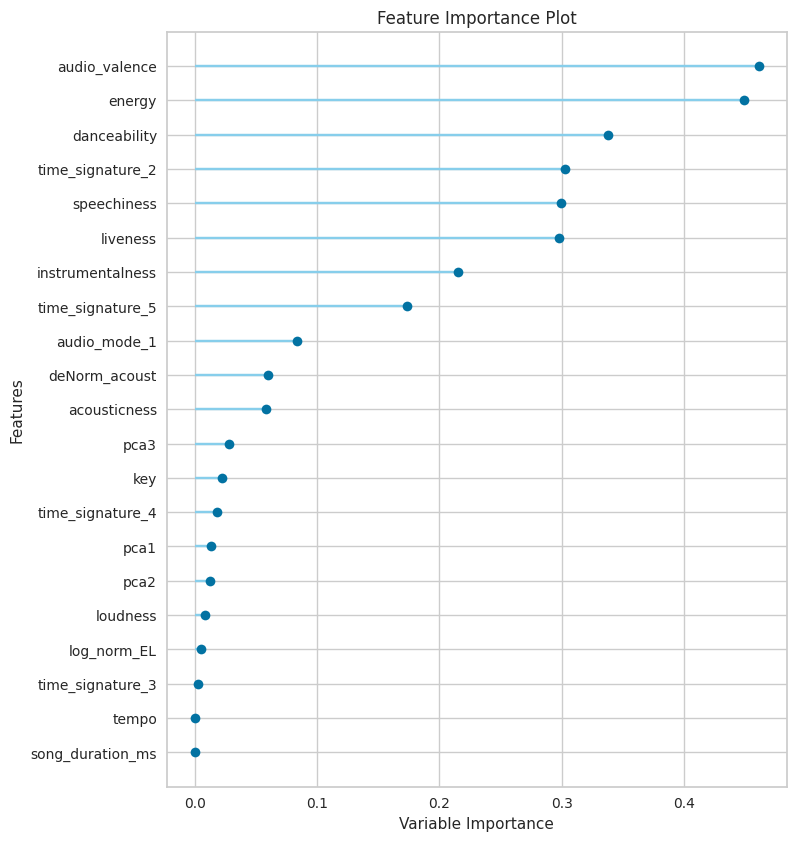

In [36]:
plot_model(best[2] ,'feature_all')

Everything looks fine till now , 

#### 🗽[go to top](#welcome)🗽


let's blend the models what if we get some more good score

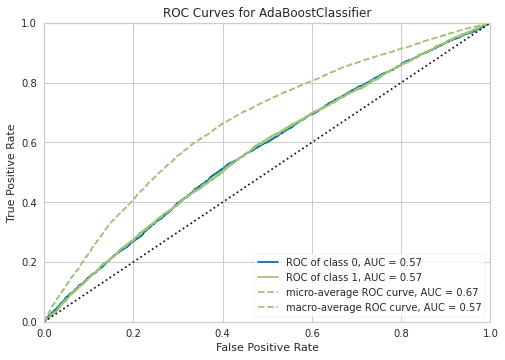

In [37]:
plot_model(best[0])

In [38]:
# blended =blend_models(estimator_list= best ,fold =5) 

, Now we got an idea what features are important , what techniques we should be using and all , now let's tune the model using optuna , pycaret tunning is time consuming 😅
#### 🗽[go to top](#welcome)🗽

### ⭕ Preparing test data for prediction

In [39]:
T_df = Tdf.drop(columns = 'id',axis =1)
T_df = FE( T_df ,
          fix_missing_value = True ,
          generate_new_feature = True,
          do_pca =True  ,pca_comp = 3,
          drop_irrelavnt = True)


shape of X :(10000, 15)
shape of X_pca(10000, 3)


In [40]:
T_df.columns

Index(['song_duration_ms', 'acousticness', 'danceability', 'energy',
       'instrumentalness', 'key', 'liveness', 'loudness', 'audio_mode',
       'speechiness', 'tempo', 'time_signature', 'audio_valence',
       'log_norm_EL', 'deNorm_acoust', 'pca1', 'pca2', 'pca3'],
      dtype='object')

In [41]:
T_df.head(3)

,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence,log_norm_EL,deNorm_acoust,pca1,pca2,pca3
0,308523.0,0.019845,0.496731,0.908939,0.001438,5.012544,0.112832,-8.890172,0,0.082714,126.129304,4,0.399620,0.922712,0.018312,-0.912080,1.685115,-1.476963
1,200011.0,0.070119,0.731256,0.444655,0.002020,10.000000,0.139040,-6.301214,0,0.061685,86.448149,3,0.499424,0.628063,0.044039,0.262732,-0.932180,-0.795024
2,279758.0,0.810637,0.568858,0.125466,0.898841,0.000000,0.226614,-11.542478,0,0.041868,99.544351,3,0.564951,0.126437,0.102495,3.915427,1.709828,-0.286869


In [42]:
# pred = predict_model(blended ,data =T_df )
# pred.head(3)

#### 🗽[go to top](#welcome)🗽

<a id ="m"/><br>

## 🌊  Model 

we got best models , I am using ,`ADA` to tune model

In [43]:
feature = [col for col in t_df.columns if col not in ("id", "song_popularity")]
scores = []
X = t_df[feature]
y = t_df['song_popularity']
# # finding the column index of categorical columns
# cat_cols = ["key", "audio_mode", "time_signature"]

# cat_indices = []
# for col in cat_cols:
#     idx = list(X.columns).index(col)
#     cat_indices.append(idx)
# cat_indices

In [44]:
def objective(trial, data=X,target=y):
    X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.10, random_state=47)
    
    params = {
                
                'n_estimators':trial.suggest_int('n_estimators',50,80,step=2),
                'learning_rate': trial.suggest_float('learning_rate', 0.1,2.5,step = 0.0000005),
                'algorithm':'SAMME.R', 
                'random_state':47
            }
    
    clf = AdaBoostClassifier(**params) 
    clf.fit(X_train, y_train)
    
    y_proba = clf.predict_proba(X_valid)[:, 1]
    auc = roc_auc_score(y_valid, y_proba)
    return auc

In [45]:
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

[I 2022-01-29 16:20:51,225] A new study created in memory with name: no-name-5977c41f-2188-4b91-889f-757eb8ee6797
[I 2022-01-29 16:20:58,911] Trial 0 finished with value: 0.5799240523887929 and parameters: {'n_estimators': 76, 'learning_rate': 0.332712}. Best is trial 0 with value: 0.5799240523887929.
[I 2022-01-29 16:21:05,759] Trial 1 finished with value: 0.5763543095587067 and parameters: {'n_estimators': 68, 'learning_rate': 1.360324}. Best is trial 0 with value: 0.5799240523887929.
[I 2022-01-29 16:21:11,761] Trial 2 finished with value: 0.5799897664223688 and parameters: {'n_estimators': 60, 'learning_rate': 0.30307799999999996}. Best is trial 2 with value: 0.5799897664223688.
[I 2022-01-29 16:21:18,893] Trial 3 finished with value: 0.5765658898557232 and parameters: {'n_estimators': 72, 'learning_rate': 0.157227}. Best is trial 2 with value: 0.5799897664223688.
[I 2022-01-29 16:21:20,637] Trial 4 finished with value: 0.46192364272184017 and parameters: {'n_estimators': 64, 'lear

#### 🗽[go to top](#welcome)🗽

In [46]:
study.best_params

{'n_estimators': 58, 'learning_rate': 0.34216199999999997}

In [47]:
print("Best parameters:")
print("*"*50)
for param, val in study.best_trial.params.items():
    print(f"{param} :\t {val}")
print("*"*50)
print(f"Best AUC score: {study.best_value}")

Best parameters:
**************************************************
n_estimators :	 58
learning_rate :	 0.34216199999999997
**************************************************
Best AUC score: 0.5825665121824641


In [48]:
X_test =T_df[feature]
skf = StratifiedKFold(n_splits=20, shuffle=True, random_state=47)

In [49]:
from time import sleep

In [50]:

predictions = []
for fold, (train_idx, val_idx) in enumerate(skf.split(X, y)):
    
    X_train, X_valid = X.iloc[train_idx], X.iloc[val_idx]
    y_train , y_valid = y.iloc[train_idx], y.iloc[val_idx]
    
    params = study.best_params
    clf = AdaBoostClassifier(**params)
    clf.fit(X_train, y_train)
    
    y_proba = clf.predict_proba(X_valid)[:, 1]
    
    
    score = roc_auc_score(y_valid, y_proba)
    
    for frame in '>>'*20:
        print(frame ,sep ='',end ='',flush =True)
        sleep(0.02)
    print(f"\nFold: {fold}, AUC: {score}")
    print("_"*40)
    test_pred = clf.predict_proba(X_test)[:,1]
    predictions.append(test_pred)

>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Fold: 0, AUC: 0.5772583192672016
________________________________________
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Fold: 1, AUC: 0.5808234870410789
________________________________________
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Fold: 2, AUC: 0.5598425316433725
________________________________________
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Fold: 3, AUC: 0.5542607361830088
________________________________________
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Fold: 4, AUC: 0.5900789294408116
________________________________________
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Fold: 5, AUC: 0.5723501794245398
________________________________________
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Fold: 6, AUC: 0.5658842787654204
________________________________________
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Fold: 7, AUC: 0.5604793043448075
________________________________________
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Fold: 8, AUC: 0.5699544170546604
______

In [51]:
preds = np.mean(np.column_stack(predictions), axis=1)
sub = pd.DataFrame(columns = ['id', 'song_popularity'])
sub['id'] = Tdf['id']
sub['song_popularity'] = preds
sub

,id,song_popularity
0,0,0.492663
1,1,0.497777
2,2,0.492477
3,3,0.491844
4,4,0.494970
...,...,...
9995,9995,0.492243
9996,9996,0.488317
9997,9997,0.491728
9998,9998,0.496860


In [52]:
submission =[]
submission.append(preds)

In [53]:
submission.append(preds)

#### 🗽[go to top](#welcome)🗽

#### ⭕Trial Prediction 2 

In [54]:
predictions = []
for fold, (train_idx, val_idx) in enumerate(skf.split(X, y)):
    
    X_train, X_valid = X.iloc[train_idx], X.iloc[val_idx]
    y_train , y_valid = y.iloc[train_idx], y.iloc[val_idx]
    params = {'n_estimators': 74, 'learning_rate': 1.472356,
             'algorithm':'SAMME', 
                'random_state':47}
    
    clf = AdaBoostClassifier(**params)
    clf.fit(X_train, y_train)
    
    y_proba = clf.predict_proba(X_valid)[:, 1]
    
    
    score = roc_auc_score(y_valid, y_proba)
    
    for frame in '>>'*20:
        print(frame ,sep ='',end ='',flush =True)
        sleep(0.02)
    print(f"\nFold: {fold}, AUC: {score}")
    print("_"*40)
    test_pred = clf.predict_proba(X_test)[:,1]
    predictions.append(test_pred)

>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Fold: 0, AUC: 0.5737978338880234
________________________________________
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Fold: 1, AUC: 0.5839124312784487
________________________________________
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Fold: 2, AUC: 0.5571305525060857
________________________________________
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Fold: 3, AUC: 0.5660019786599786
________________________________________
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Fold: 4, AUC: 0.5615255858959728
________________________________________
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Fold: 5, AUC: 0.5665232210501652
________________________________________
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Fold: 6, AUC: 0.5744785406514824
________________________________________
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Fold: 7, AUC: 0.5450128873248604
________________________________________
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Fold: 8, AUC: 0.5643878086774654
______

In [55]:
preds = np.mean(np.column_stack(predictions), axis=1)
sub = pd.DataFrame(columns = ['id', 'song_popularity'])
sub['id'] = Tdf['id']
sub['song_popularity'] = preds
sub

,id,song_popularity
0,0,0.467138
1,1,0.500359
2,2,0.460439
3,3,0.461156
4,4,0.480380
...,...,...
9995,9995,0.462669
9996,9996,0.453308
9997,9997,0.458302
9998,9998,0.488407


In [56]:
submission.append(preds)

#### 🗽[go to top](#welcome)🗽

#### ⭕Trial prediction 3 

In [57]:
predictions = []
for fold, (train_idx, val_idx) in enumerate(skf.split(X, y)):
    
    X_train, X_valid = X.iloc[train_idx], X.iloc[val_idx]
    y_train , y_valid = y.iloc[train_idx], y.iloc[val_idx]
    params = {'n_estimators': 68, 'learning_rate': 0.3225445,
             'algorithm':'SAMME', 
                'random_state':47}
    
    clf = AdaBoostClassifier(**params)
    clf.fit(X_train, y_train)
    
    y_proba = clf.predict_proba(X_valid)[:, 1]
    
    
    score = roc_auc_score(y_valid, y_proba)
    
    for frame in '>>'*20:
        print(frame ,sep ='',end ='',flush =True)
        sleep(0.02)
    print(f"\nFold: {fold}, AUC: {score}")
    print("_"*40)
    test_pred = clf.predict_proba(X_test)[:,1]
    predictions.append(test_pred)

>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Fold: 0, AUC: 0.5722541753630797
________________________________________
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Fold: 1, AUC: 0.566995105420053
________________________________________
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Fold: 2, AUC: 0.5568165053219879
________________________________________
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Fold: 3, AUC: 0.558355824680312
________________________________________
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Fold: 4, AUC: 0.5812666244321115
________________________________________
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Fold: 5, AUC: 0.5599233486216637
________________________________________
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Fold: 6, AUC: 0.5600030808083
________________________________________
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Fold: 7, AUC: 0.5548872033637219
________________________________________
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Fold: 8, AUC: 0.5667651295892111
___________

In [58]:
preds = np.mean(np.column_stack(predictions), axis=1)
sub = pd.DataFrame(columns = ['id', 'song_popularity'])
sub['id'] = Tdf['id']
sub['song_popularity'] = preds
sub

,id,song_popularity
0,0,0.385463
1,1,0.431660
2,2,0.392252
3,3,0.387170
4,4,0.414791
...,...,...
9995,9995,0.375646
9996,9996,0.331857
9997,9997,0.375784
9998,9998,0.434886


In [59]:
submission.append(preds)

In [60]:
np.shape(submission)

(4, 10000)

<a id="p"/><br>

# 💠 Predictions 

In [61]:
preds = np.mean(np.column_stack(submission), axis=1)
final_sub = pd.DataFrame(columns = ['id', 'song_popularity'])
final_sub['id'] = Tdf['id']
final_sub['song_popularity'] = preds
final_sub

,id,song_popularity
0,0,0.459482
1,1,0.481893
2,2,0.459411
3,3,0.458004
4,4,0.471278
...,...,...
9995,9995,0.455700
9996,9996,0.440450
9997,9997,0.454386
9998,9998,0.479253


In [62]:
final_sub.to_csv("submission.csv",index=False)

#### 🗽[go to top](#welcome)🗽

<a id="c"/><br>

# 🍀 Conclusion 

1. Pycaret is easy to use for checking models
2. Adaboost can also be used for training the model but it's not the most efficient solution
3. Imputers are really good
4. thanks to all people who helped me to reach upto this solution

hope you liked this combination of pycaret + optuna 😅

let's meet in next notebook ...🙋‍♂️

#### 🗽[go to top](#welcome)🗽

If you got some good info do like , share and comment ...see you! 

refer some work in  other running challenges <br>[TPS Jan 22 series](https://www.kaggle.com/sarabhian/free-time-learning)<br>
[tensorflow GBR](https://www.kaggle.com/sarabhian/gbr-extremely-beginner-level-guide-1)<br>
[SPP Lightgbm](https://www.kaggle.com/sarabhian/spp-free-time-learning-optuna-auto-tuning)